In [2]:
import cv2
import os

video_path = r"C:\Users\User\Desktop\project\Project_videos\Edge_tracking\edge.mp4"
output_folder = r"C:\Users\User\Desktop\project\Frames"

os.makedirs(output_folder, exist_ok=True)

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error opening video file")
    exit()

frame_index = 0
saved_count = 0

while True:
    ret, frame = cap.read()
    
    if not ret:
        break

    #frame = cv2.rotate(frame, cv2.ROTATE_90_CLOCKWISE)
    # Save every 10th frame
    if frame_index % 10 == 0:
        filename = os.path.join(output_folder, f"frame_{saved_count:05d}.jpg")
        cv2.imwrite(filename, frame)
        saved_count += 1
    
    frame_index += 1

cap.release()

print(f"Done! Saved {saved_count} frames.")

Done! Saved 62 frames.


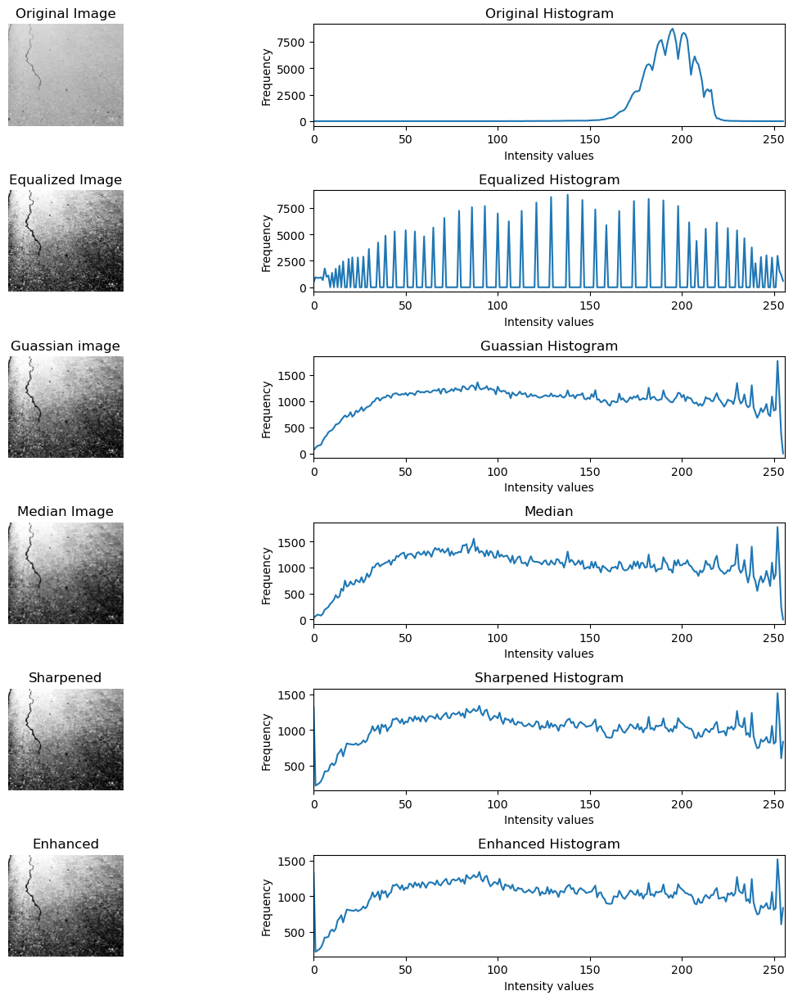

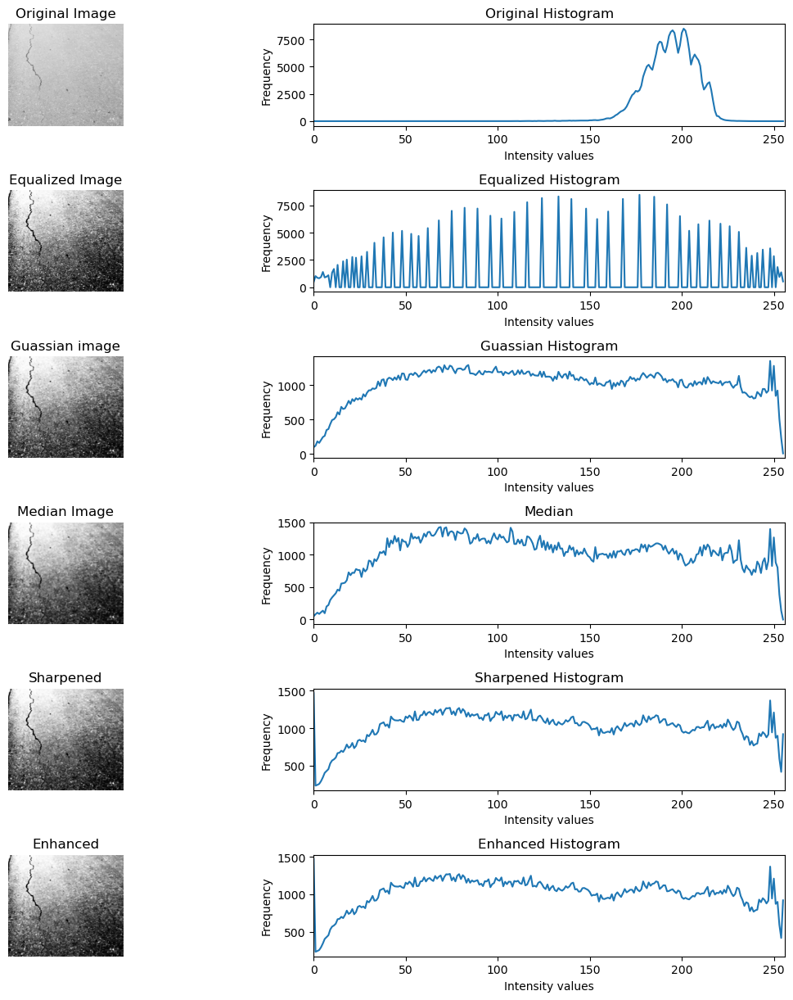

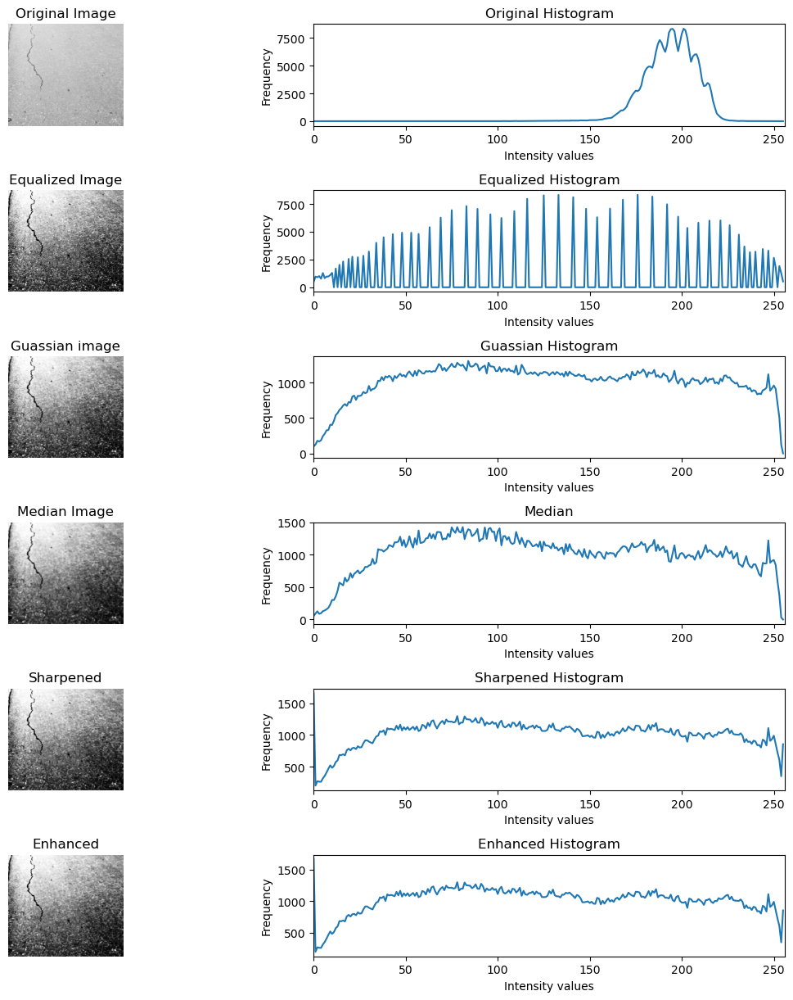

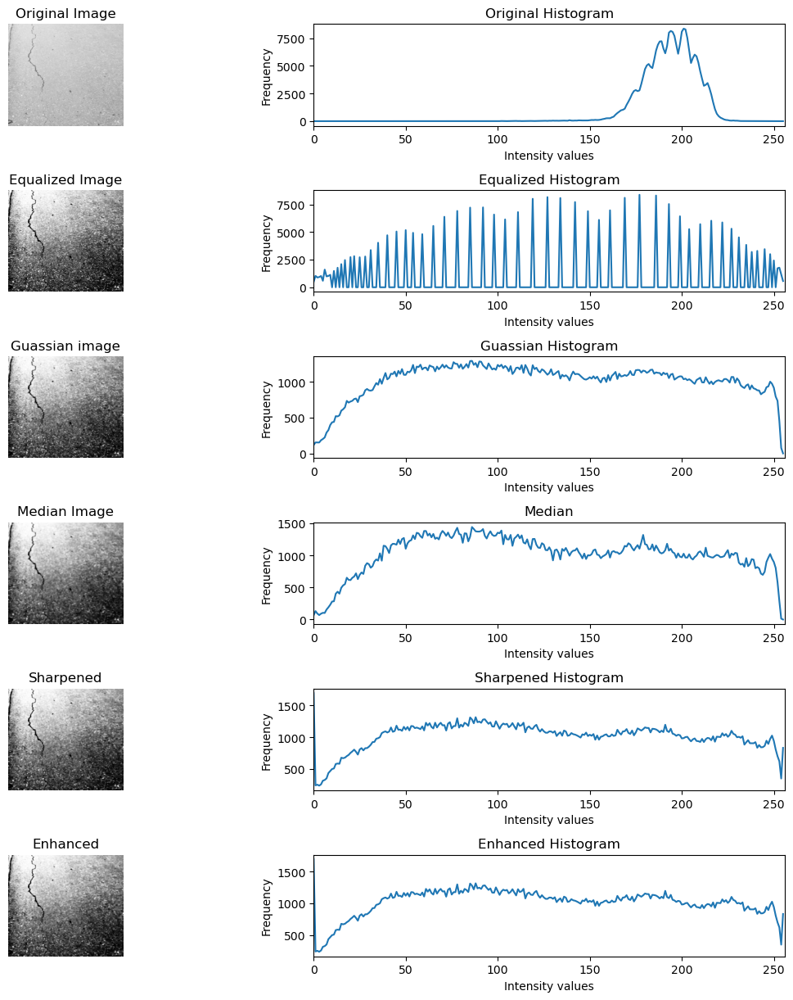

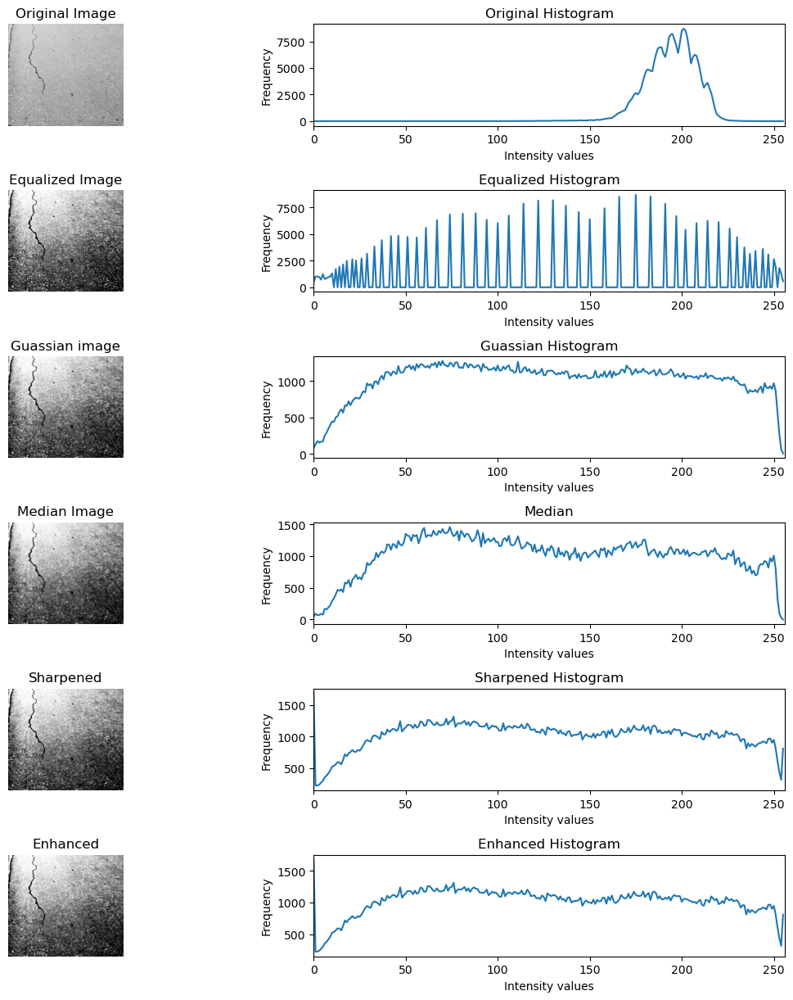

...

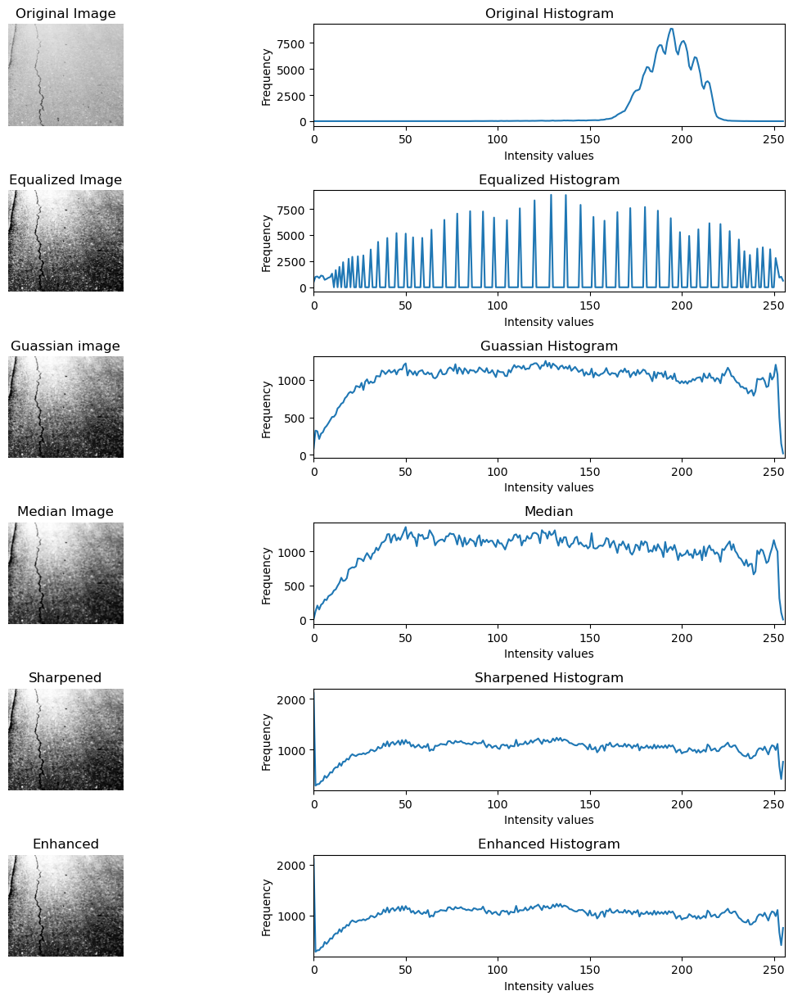

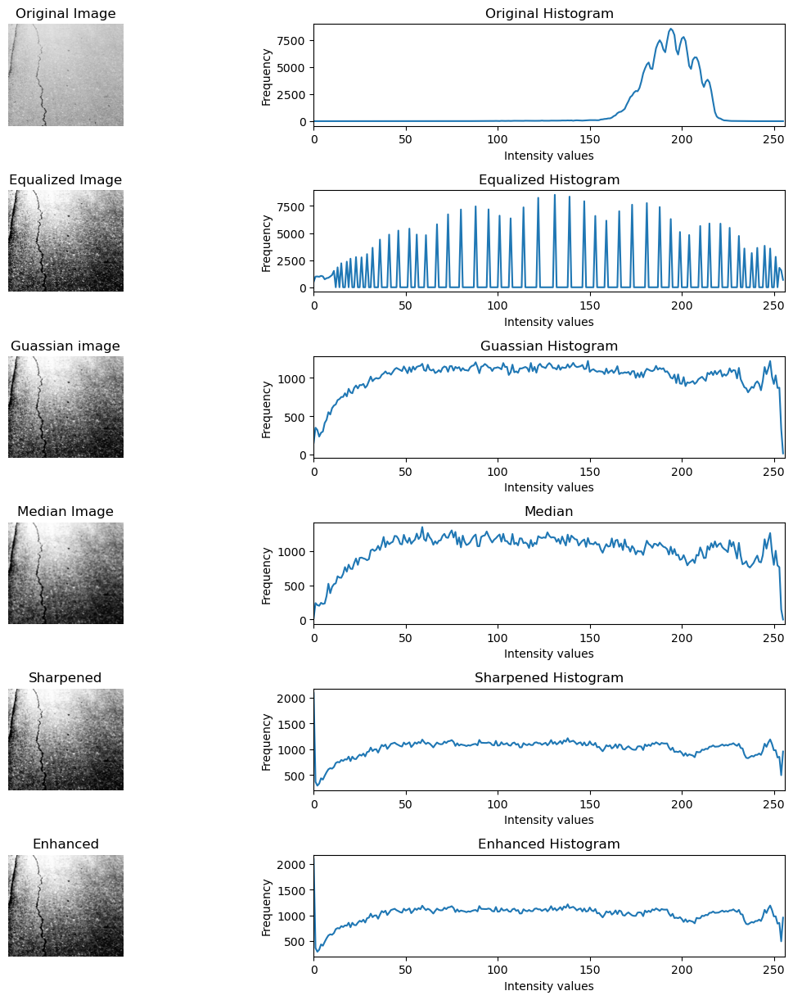

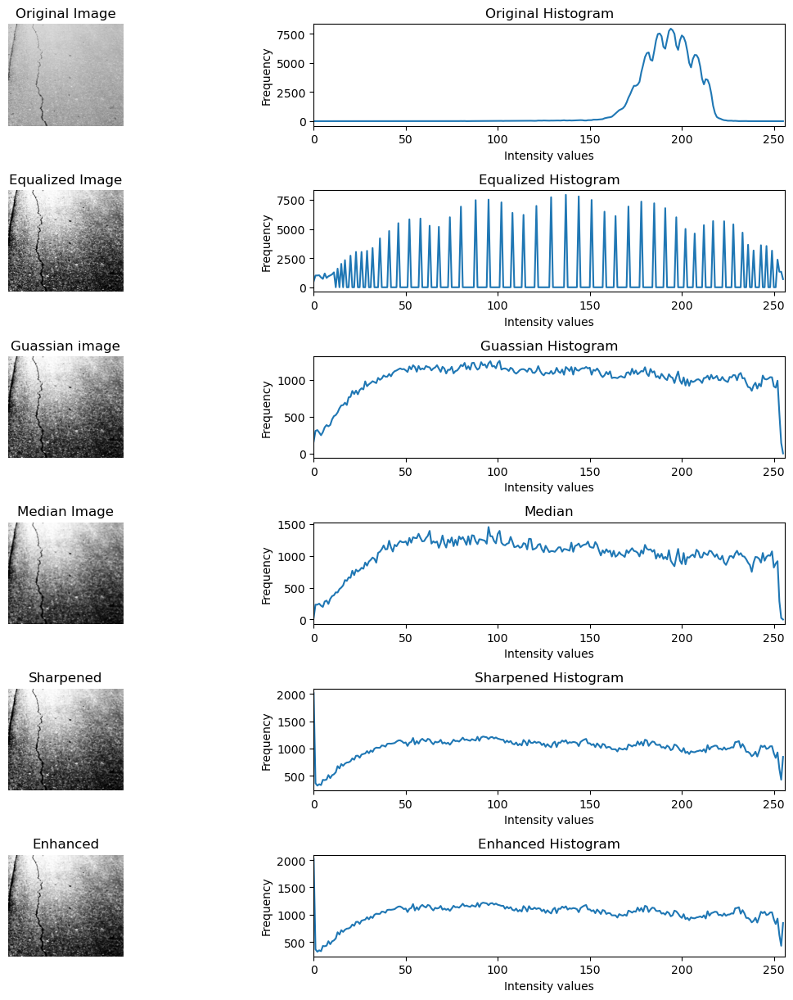

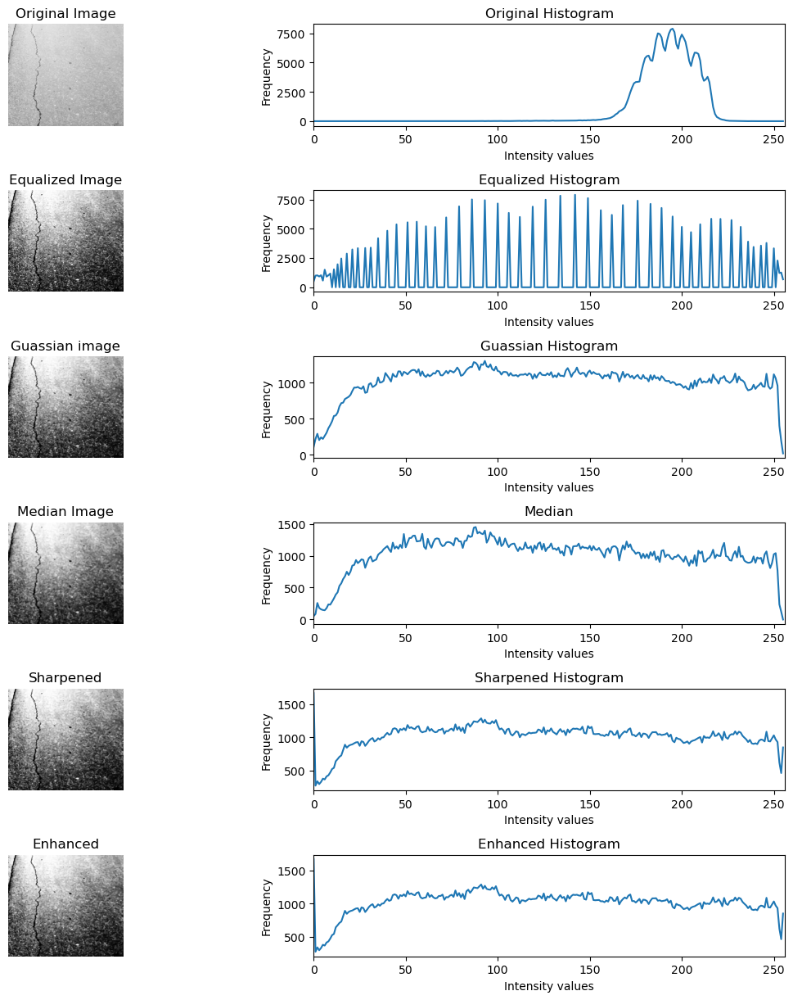

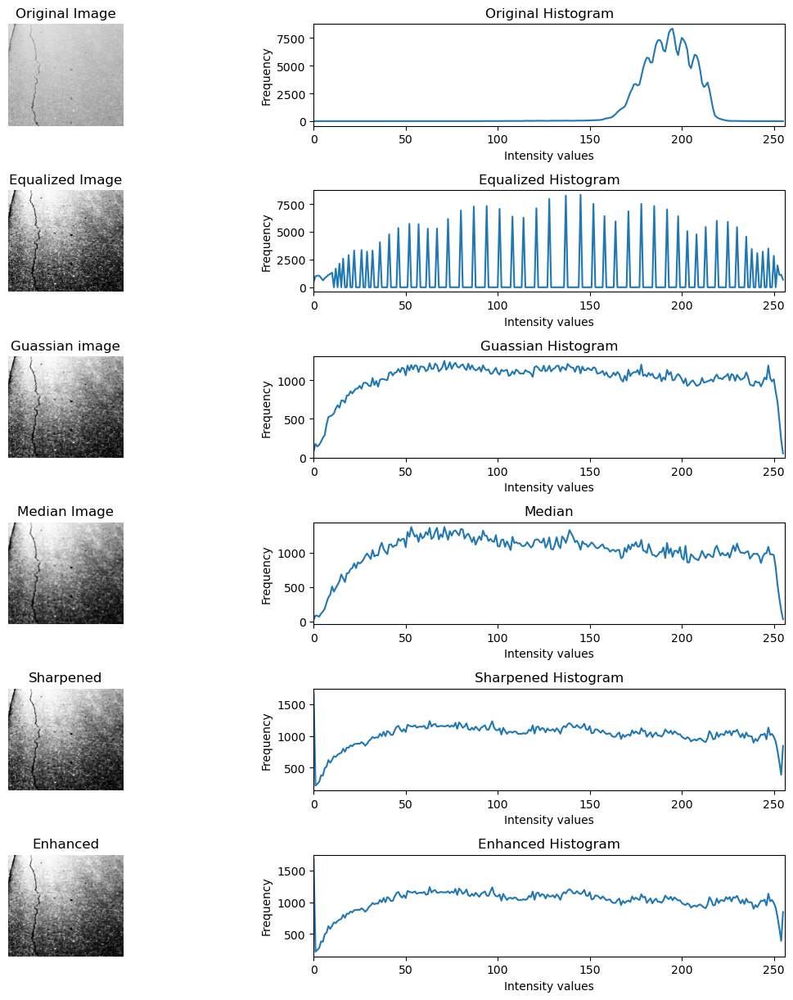

KeyboardInterrupt: 

In [3]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

def histogram(image,title):
    histogram = cv2.calcHist([image],[0],None,[256],[0,256])

    plt.title(title)
    plt.xlabel("Intensity values")
    plt.ylabel("Frequency")
    plt.plot(histogram)
    plt.xlim([0,256])



# SAVE FILES INTO THE FOLDER PATH

# Input path
input_folder = r"C:\Users\User\Desktop\project\Frames"

# Eqaulized output folder path
equalized_output = r"C:\Users\User\Desktop\project\Equalized_Frames"

# equalized_guassian folder path
equalized_guassian = r"C:\Users\User\Desktop\project\Equalized_Guassian_Frames"

# Equalized_Guassian_Median folder path
equalized_guassian_median = r"C:\Users\User\Desktop\project\Equalized_Guassianed_Median_Frames"

# Equalized_Guassianed_Median_Sharpened folder path
equalized_guassian_median_sharpend = r"C:\Users\User\Desktop\project\Equalized_Guassianed_Median_Sharpened_Frames"

#Final_Enhanced_Frames
Final_Enhanced_Frames = r"C:\Users\User\Desktop\project\Final_Enhanced_Frames"

# Final folder path
output_folder = r"C:\Users\User\Desktop\project\output_folder"

# Create output folder if it doesn't exist
os.makedirs(equalized_output, exist_ok=True)
os.makedirs(equalized_guassian, exist_ok=True)
os.makedirs(equalized_guassian_median, exist_ok=True)
os.makedirs(equalized_guassian_median_sharpend, exist_ok=True)
os.makedirs(Final_Enhanced_Frames, exist_ok=True)
os.makedirs(output_folder, exist_ok=True)

#image_extensions = ('.png', '.jpg', '.jpeg', '.tif', '.bmp')


# Loop through all images
for filename in os.listdir(input_folder):

    #if filename.lower().endswith(image_extensions):

        input_path = os.path.join(input_folder, filename)
        img = cv2.imread(input_path, 0)

        if img is None:
            continue


    # Equalization Apply
        equalized = cv2.equalizeHist(img)

    # Noice Remoeval
        # Guassian Apply
        guassian = cv2.GaussianBlur(equalized,(5,5),1.0)
        # Median Apply
        median = cv2.medianBlur(guassian,(5))

    # Calculate Sharpness
        laplacian = cv2.Laplacian(median, cv2.CV_64F)
        sharpness = laplacian.var()

    # Apply sharpening
        sharpened = median - laplacian
        sharpened = np.clip(sharpened, 0, 255).astype(np.uint8)
        enhanced = sharpened


    
        plt.figure(figsize =(12,20))

    
    # Display Original Image 
        plt.subplot(10, 2, 1)
        plt.imshow(img, cmap='gray')
        plt.title("Original Image")
        plt.axis('off')
    # Display Original Image Histogram
        plt.subplot(10,2,2)
        histogram(img,"Original Histogram")

    
    # Display Equalized Image
        plt.subplot(10, 2, 3)
        plt.imshow(equalized, cmap='gray')
        plt.title("Equalized Image")
        plt.axis('off')
    # Display Equalized Image Histogram
        plt.subplot(10, 2, 4)
        histogram(equalized, "Equalized Histogram")

    
    # Display Equalized_Guassian Image
        plt.subplot(10,2,5)
        plt.imshow(guassian, cmap='gray')
        plt.title("Guassian image")
        plt.axis('off')
    # Display Equalized_Guassian Image Histogram
        plt.subplot(10,2,6)
        histogram(guassian,"Guassian Histogram")

    
    # Display Equalized_Guassianed_Median Image
        plt.subplot(10,2,7)
        plt.imshow(median, cmap='gray')
        plt.title("Median Image")
        plt.axis('off')
    # Display Equalized_Guassianed_Median Image Histogram
        plt.subplot(10,2,8)
        histogram(median,"Median")

    
    # Display Equalized_Guassianed_Median_Sharpened Image
        plt.subplot(10,2,9)
        plt.imshow(sharpened, cmap='gray')
        plt.title("Sharpened")
        plt.axis("off")
    # Display Equalized_Guassianed_Median_Sharpened Image Histogram
        plt.subplot(10,2,10)
        histogram(sharpened,"Sharpened Histogram")

    # Display Equalized_Guassianed_Median_Sharpened Image
        plt.subplot(10,2,11)
        plt.imshow(enhanced, cmap='gray')
        plt.title("Enhanced")
        plt.axis("off")
    # Display Equalized_Guassianed_Median_Sharpened Image Histogram
        plt.subplot(10,2,12)
        histogram(enhanced,"Enhanced Histogram")

    
        plt.tight_layout()
        plt.show()


        # SAVE FILES INTO THE FOLDER PATH
        
        # Eqaulized output folder path
        cv2.imwrite(os.path.join(equalized_output, f"{os.path.splitext(filename)[0]}_equalized.png"), equalized)

        # equalized_guassian folder path
        cv2.imwrite(os.path.join(equalized_guassian, f"{os.path.splitext(filename)[0]}_guassian.png"), guassian)

        # Equalized_Guassian_Median folder path
        cv2.imwrite(os.path.join(equalized_guassian_median, f"{os.path.splitext(filename)[0]}_median.png"), median)

        # Equalized_Guassianed_Median_Sharpened folder path
        cv2.imwrite(os.path.join(equalized_guassian_median_sharpend, f"{os.path.splitext(filename)[0]}_sharpened.png"), sharpened)

        # Final Enhanced folder path
        cv2.imwrite(os.path.join(Final_Enhanced_Frames, f"{os.path.splitext(filename)[0]}_enhanced.png"), enhanced)

        #Final output folder path
        cv2.imwrite(os.path.join(output_folder, f"{os.path.splitext(filename)[0]}_enhanced.png"), enhanced)
        
print("Output Display Completed.")

In [4]:
saved_frames = sorted([f for f in os.listdir(output_folder)])
sample = cv2.imread(os.path.join(output_folder, saved_frames[0]))
h, w = sample.shape[:2]

fps = len(saved_frames) / 8  # auto calculate FPS based on 8s video

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_out = cv2.VideoWriter("edge_enhanced_output.mp4", fourcc, fps, (w, h))
for fname in saved_frames:
    frame = cv2.imread(os.path.join(output_folder, fname))
    video_out.write(frame)
video_out.release()

print("Video saved → edge_enhanced_output.mp4")

# Play video
cap = cv2.VideoCapture("edge_enhanced_output.mp4")
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    cv2.imshow("Enhanced Video1", frame)
    if cv2.waitKey(int(1000 / fps)) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

Video saved → edge_enhanced_output.mp4


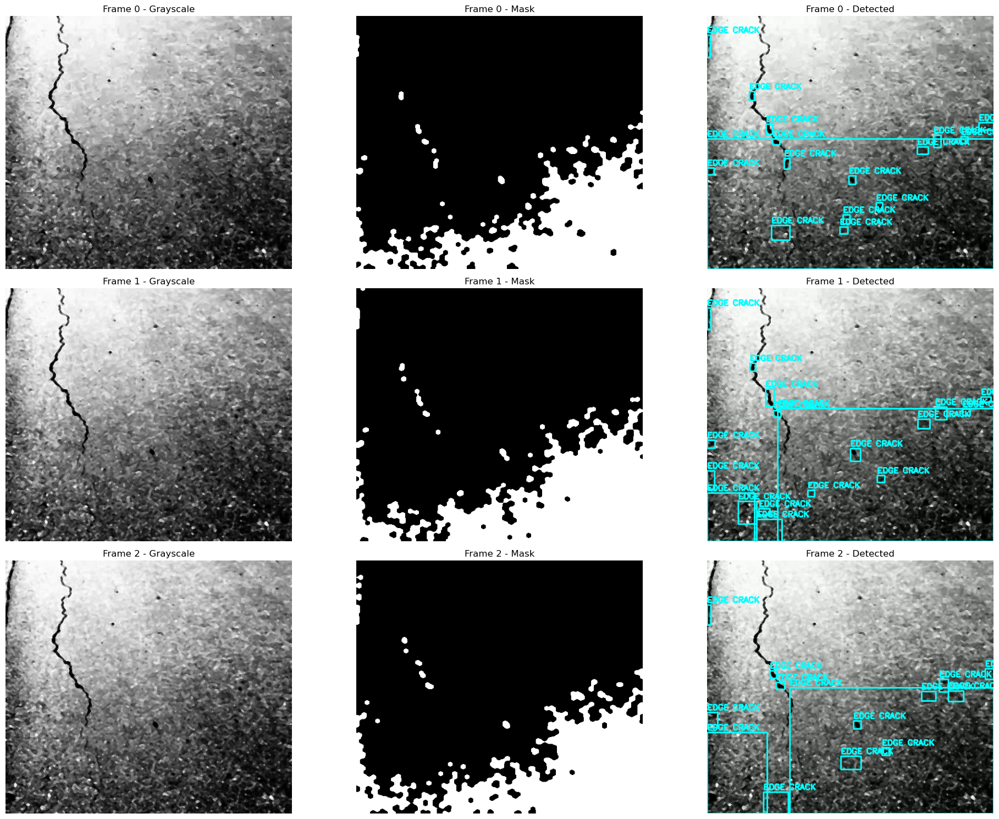

Video saved → edge_detection.mp4
Done! Processed frames: 33


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# INPUT / OUTPUT PATHS

input_video = r"C:\Users\User\Desktop\project\edge_enhanced_output.mp4"
output_video = "edge_detection.mp4"

output_frames = []

cap = cv2.VideoCapture(input_video)
fps = cap.get(cv2.CAP_PROP_FPS)
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

plot_grays    = []
plot_masks    = []
plot_detected = []
frame_id = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    img = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    original = frame.copy()

    # ==============================
    # EDGE CRACK SEGMENTATION
    # ==============================

    # Thresholding (FIXED)
    _, thresh = cv2.threshold(img, 60, 255, cv2.THRESH_BINARY_INV)

    # Morphology
    k_s = np.ones((3,3), np.uint8)
    k_l = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))

    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, k_s, iterations=2)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, k_l, iterations=2)
    mask = cv2.erode(cv2.dilate(closing, k_l, iterations=1), k_s, iterations=1)

   
    # CONTOURS
  
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    for cnt in contours:
        area = cv2.contourArea(cnt)

        if area < 100:
            continue

        x, y, w_box, h_box = cv2.boundingRect(cnt)
        cv2.rectangle(original, (x, y), (x+w_box, y+h_box), (255, 255, 0), 2)
        cv2.putText(original, "EDGE CRACK", (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 0), 2)

    # Store first 3 frames
    if frame_id < 3:
        plot_grays.append(img.copy())
        plot_masks.append(mask.copy())  # FIXED
        plot_detected.append(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))

    output_frames.append(original.copy())
    frame_id += 1

cap.release()


# PLOT first 3 frames

plt.figure(figsize=(20, 15))

for i in range(3):
    plt.subplot(3, 3, i * 3 + 1)
    plt.imshow(plot_grays[i], cmap='gray')
    plt.title(f"Frame {i} - Grayscale")
    plt.axis('off')

    plt.subplot(3, 3, i * 3 + 2)
    plt.imshow(plot_masks[i], cmap='gray')
    plt.title(f"Frame {i} - Mask")
    plt.axis('off')

    plt.subplot(3, 3, i * 3 + 3)
    plt.imshow(plot_detected[i])
    plt.title(f"Frame {i} - Detected")
    plt.axis('off')

plt.tight_layout()
plt.savefig("edge_plot.png", dpi=100)
plt.show()


# SAVE VIDEO

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_out = cv2.VideoWriter(output_video, fourcc, fps, (w, h))

for f in output_frames:
    video_out.write(f)

video_out.release()

print(f"Video saved → {output_video}")


# PLAY VIDEO

cap = cv2.VideoCapture(output_video)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    cv2.imshow("Edge Crack Detection", frame)

    if cv2.waitKey(int(1000 / fps)) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

print(f"Done! Processed frames: {frame_id}")